# Environment:

In [1]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 41.9 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [10]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.datasets import Caltech256
import timm
import os

In [4]:
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image

# Model and Data Initialization:

In [11]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [14]:
model = models.mobilenet_v3_small(pretrained=True)
model.fc = torch.nn.Identity()  # Remove the final classification layer
model = model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Small_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Small_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth
100%|██████████| 9.83M/9.83M [00:00<00:00, 172MB/s]


In [17]:
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to match MobileNet input size
    transforms.Lambda(lambda img: img.convert('RGB') if img.mode != 'RGB' else img),  # Convert grayscale to RGB
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [18]:
data_dir = './caltech256'
caltech256 = Caltech256(root=data_dir, download=True, transform=preprocess)
dataloader = DataLoader(caltech256, shuffle=False)

Downloading...
From (original): https://drive.google.com/uc?id=1r6o0pSROcV1_VwT4oSjA2FBUSCWGuxLK
From (redirected): https://drive.usercontent.google.com/download?id=1r6o0pSROcV1_VwT4oSjA2FBUSCWGuxLK&confirm=t&uuid=759cb804-fd4e-4de1-91de-6279c89564b8
To: /content/caltech256/caltech256/256_ObjectCategories.tar
100%|██████████| 1.18G/1.18G [00:13<00:00, 87.8MB/s]


Extracting ./caltech256/caltech256/256_ObjectCategories.tar to ./caltech256/caltech256


# Encoding image into vectors with the model:

In [19]:
def encode_images(model, dataloader, device):
    model.eval()  # Set the model to evaluation mode
    all_features = []
    all_labels = []

    for images, labels in dataloader:
        images = images.to(device)

        # Ensure the images are 3 channels
        if images.size(1) != 3:
            raise ValueError(f"Expected 3 channels but got {images.size(1)} channels.")

        # Extract features using InceptionV3
        with torch.no_grad():
            image_features = model(images)

        # Store the vector representation
        all_features.append(image_features.cpu())
        all_labels.append(labels)

    all_features = torch.cat(all_features)
    all_labels = torch.cat(all_labels)

    return all_features, all_labels

In [20]:
import time
start_time = time.time()
encoded_features, labels = encode_images(model, dataloader, device)
end_time = time.time()

print(f"Time taken to encode images: {end_time - start_time} seconds")
print("Encoded Features Shape:", encoded_features.shape)
print("Labels Shape:", labels.shape)

Time taken to encode images: 295.30860352516174 seconds
Encoded Features Shape: torch.Size([30607, 1000])
Labels Shape: torch.Size([30607])


## Sample Image and its vector representation:

In [21]:
def show_image(image_tensor):
    image = image_tensor.squeeze(0)
    image = image.permute(1, 2, 0).cpu().numpy()  # Dimensions (C, H, W) -> (H, W, C)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

First image in the dataset:


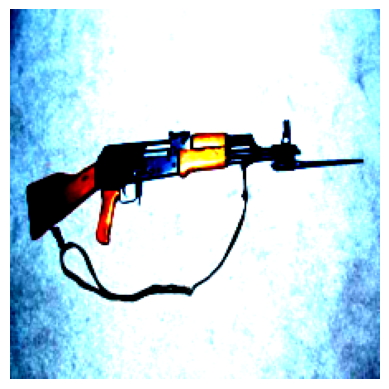


CLIP vector representation of the first image:
[[-4.91080904e+00 -4.02823114e+00 -7.12521982e+00 -6.90161371e+00
  -2.46492219e+00 -2.84861708e+00 -5.42405558e+00 -3.47513533e+00
  -6.62397099e+00 -1.05527477e+01 -3.12621260e+00 -6.66785526e+00
  -7.85928249e+00 -6.39736938e+00 -3.91410017e+00 -4.09946251e+00
  -2.83105564e+00 -4.42437744e+00 -2.62103081e+00 -7.36916161e+00
  -6.86734915e+00 -4.08468914e+00 -6.18287468e+00 -7.23036718e+00
  -7.60030603e+00 -3.05482125e+00 -1.21655107e+00 -2.08443737e+00
  -2.96523023e+00 -5.56786108e+00 -8.64963722e+00 -8.32128048e+00
  -6.07511425e+00 -5.18020868e+00 -2.82782960e+00 -6.70094204e+00
  -3.18925810e+00 -7.22369289e+00 -1.01133990e+00 -6.36508465e+00
  -3.57821679e+00 -8.01145852e-01 -1.79558778e+00 -2.67483401e+00
  -2.49920988e+00 -9.04388523e+00 -3.22604799e+00 -2.09339547e+00
  -7.93583775e+00 -7.60512781e+00 -6.67403316e+00 -7.06368160e+00
  -7.53676271e+00 -8.36615562e+00 -7.62991714e+00 -9.06236649e+00
  -5.25671911e+00 -1.0699423

In [22]:
# Get the first image and label from the dataloader
first_image, first_label = next(iter(dataloader))  # Directly unpack the first batch

# Convert the label to integer
first_label = first_label.item()

# Accessing the class names from the dataset within the dataloader
class_names = dataloader.dataset.categories  # Caltech256 uses 'categories'

print("First image in the dataset:")
show_image(first_image)  # Function to display the image

# Move the image to the device
first_image = first_image.to(device)

with torch.no_grad():
    first_image_features = model(first_image)

# Retrieve the class name corresponding to the label
first_image_class = class_names[first_label]  # Mapping label to class name

print("\nCLIP vector representation of the first image:")
print(first_image_features.cpu().numpy())

print("\nClass label of the first image: ", first_image_class)

# Content Based Image Retrieval:

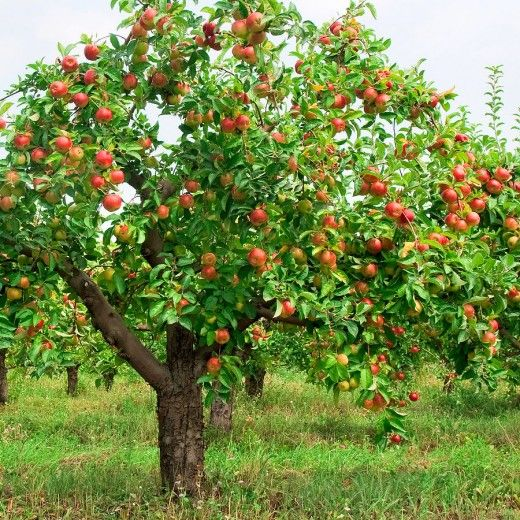

In [25]:
img = Image.open("/content/fruit_tree.jpg").convert("RGB")
img

## Encoding:

In [26]:
img = preprocess(img).unsqueeze(0).to(device)  # Preprocess and add a batch dimension

with torch.no_grad():
    uploaded_image_features = model(img)

## Similarity:

In [27]:
similarities = cosine_similarity(uploaded_image_features.cpu(), encoded_features.cpu())
top_k_indices = similarities[0].argsort()[-5:][::-1]
top_k_indices

array([29803, 18003,  9833, 29960, 17708])

In [28]:
def display_similar_images(top_indices, dataset, labels):
    plt.figure(figsize=(15, 10))
    for i, idx in enumerate(top_indices):
        image, label = dataset[idx]
        plt.subplot(1, len(top_indices), i + 1)
        plt.imshow(image.permute(1, 2, 0))  # Permute the image for display (C, H, W) -> (H, W, C)
        plt.title(f"Category: {caltech256.categories[labels[idx]]}")
        plt.axis('off')
    plt.show()


Top 5 similar images to the uploaded image:


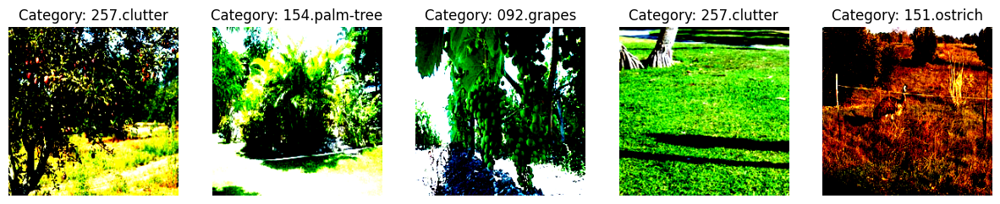

In [29]:
print("\nTop 5 similar images to the uploaded image:")
display_similar_images(top_k_indices, caltech256, labels)

## CBIR Performance Evaluation:

Select 100 indices

In [30]:
random_indices = np.array([ 8153,  7119, 16180,  4609, 25123, 15526, 20439,  2453,  1130, 3298, 27023, 15999, 16062,  6199,  7214, 25768, 13188,  3905, 4002, 10923, 19335, 28504, 13180, 12051, 16704, 24288,  3076, 14994, 24382, 25161,  4341, 10762, 13192, 23363, 30054, 22164, 28879, 21069,  8786,  4232, 19932,  5902, 14230, 13731, 28143, 10307, 15695, 23724,  2014, 14552,   576, 16124, 25022, 10407, 10108, 20941,  1211, 22070, 24498,   929,  6493, 14005,  8856, 22875, 15658, 7964, 19048,  5470,  3874, 20965, 10458, 23041, 24038, 18835, 723, 1518, 7470, 6254, 8094, 30113, 20290, 23163, 279, 23985, 26133, 1048, 8825, 2658, 14922, 17948, 17873, 14217, 12475, 12515, 20745, 21105, 2079, 28200, 18144, 11792])
len(random_indices)

100

Retrieve function that returns accuracy of each retrieval

In [31]:
def retrieve_similar_images(query_index, encoded_features, dataloader, labels, k=10):
    """
    Retrieve and print the top-k similar images based on cosine similarity, along with their labels.
    Returns a score indicating how many retrieved images share the same label as the query image.

    Args:
    - query_index (int): Index of the query image in the dataset.
    - encoded_features (torch.Tensor): Encoded features of all images in the dataset.
    - dataloader (torch.utils.data.DataLoader): Dataloader containing the dataset images.
    - labels (list): List of labels corresponding to the dataset images.
    - k (int): Number of similar images to retrieve (default is 10).

    Returns:
    - score (int): Number of retrieved images with the same label as the query image.
    """

    # Access the dataset from the dataloader
    dataset = dataloader.dataset

    # Convert encoded features to numpy if it's a tensor
    encoded_features_np = encoded_features.cpu().numpy() if isinstance(encoded_features, torch.Tensor) else encoded_features

    # Step 1: Extract the query image feature vector
    query_feature = encoded_features_np[query_index].reshape(1, -1)

    # Step 2: Compute cosine similarities between the query feature and all other features
    similarities = cosine_similarity(query_feature, encoded_features_np).flatten()

    # Step 3: Get the indices of the top-k most similar images (excluding the query image itself)
    top_k_indices = similarities.argsort()[-(k + 1):][::-1]  # Get k+1 to include the query image itself

    # Step 4: Display the query image and the top-k similar images
    query_image, _ = dataset[query_index]  # Extract the query image from the dataset

    # Initialize score counter
    score = 0

    # Plot the query image
    plt.figure(figsize=(15, 5))
    plt.subplot(1, k + 1, 1)
    plt.imshow(query_image.permute(1, 2, 0))  # Change dimensions to HxWxC for plotting
    plt.title(f'Query Image\nLabel: {labels[query_index]}')
    plt.axis('off')

    for i, idx in enumerate(top_k_indices[1:k + 1]):  # Skip the first one as it is the query image itself
        similar_image, _ = dataset[idx]  # Get the similar image
        plt.subplot(1, k + 1, i + 2)
        plt.imshow(similar_image.permute(1, 2, 0))  # Change dimensions to HxWxC for plotting
        plt.title(f"Rank {i + 1}\nLabel: {labels[idx]}")
        plt.axis('off')

        # Check if the label matches the query label
        if labels[idx] == labels[query_index]:
            score += 1
    plt.show()

    return score

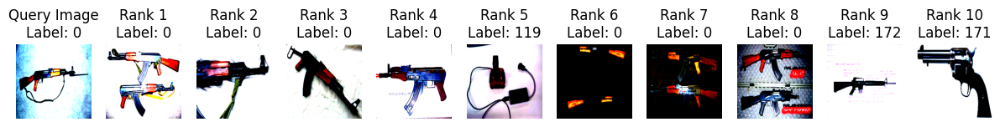

7

In [32]:
retrieve_similar_images(query_index=0, encoded_features=encoded_features, dataloader=dataloader, labels=labels, k=10)

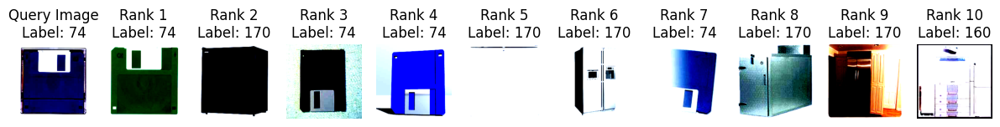

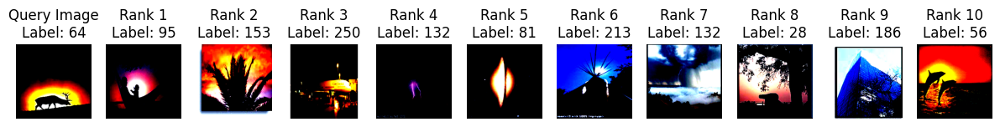

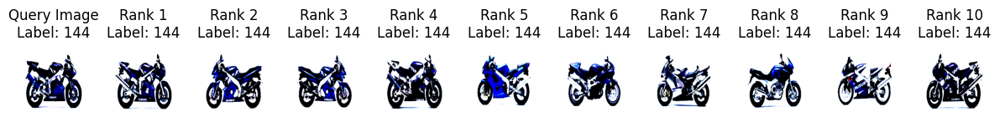

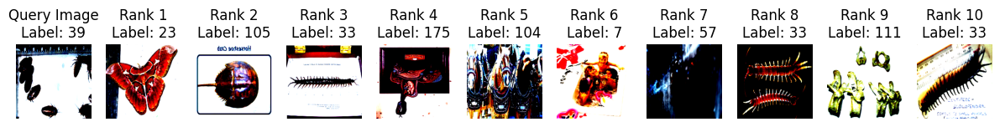

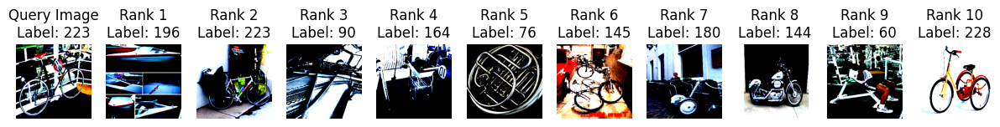

...

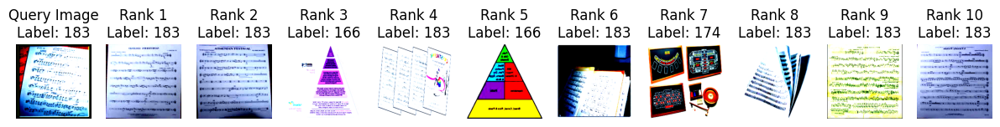

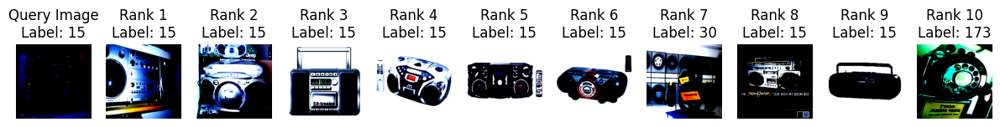

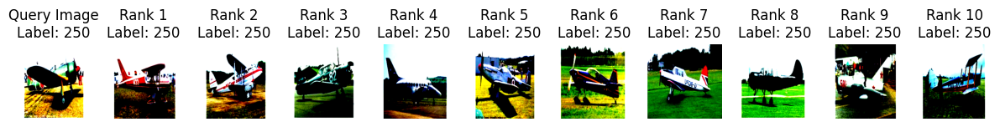

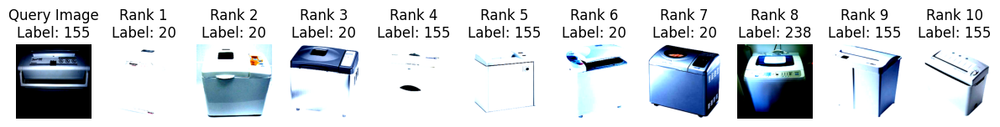

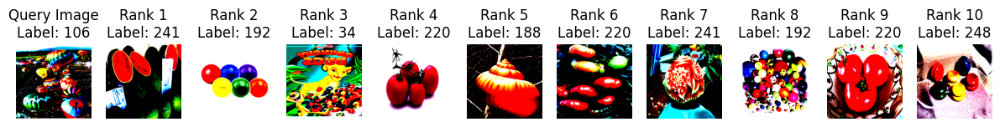

Accuracies for each query image: [ 4  0 10  0  1  7  1  1  0  6 10  9  9  5 10  8  6  1  3 10  5 10  1  9
 10  5  1  0  4 10 10 10  7  3  0  1 10  2  7  0 10  0 10  0 10  9 10  5
  1  5  5  5  9  6  2  1 10  4  7 10  2  0  7  3 10  6  1  4  2 10  6  2
  8  9  0  9  0  8  8  5  5  9  6  2  3  3  6  6  1  5  6 10 10  6  3  7
  8 10  4  0]


In [33]:
accuracies = []
for index in random_indices:
    score = retrieve_similar_images(query_index=index, encoded_features=encoded_features, dataloader=dataloader, labels=labels, k=10)
    accuracies.append(score)
accuracies_array = np.array(accuracies)
print("Accuracies for each query image:", accuracies_array)

In [34]:
np.mean(accuracies_array)

5.35